<a href="https://colab.research.google.com/github/Rinkusoni2910/EDA-on-on_the_aspiring_minds_employability_outcomes_2015_data_set./blob/main/(EDA)_on_the_aspiring_minds_employability_outcomes_2015_data_set.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Exploratory Data Analysis(EDA) on the aspiring_minds_employability_outcomes_2015 data-set
#Exploratory Data Analysis(EDA)
Introduction
Exploratory data analysis is the first and most important phase in any data analysis. EDA is a method or philosophy that aims to uncover the most important and frequently overlooked patterns in a data set. We examine the data and attempt to formulate a hypothesis. Statisticians use it to get a bird eyes view of data and try to make sense of it.

In this EDA series we will cover the following points:
1. Data sourcing
2. Data cleaning
3. Univariate analysis
4. Bi-variate/Multivariate analysis

#Dataset description
The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate.
#Objective
To perform EDA on the given dataset and find solution to the below questions:


1.   Times of India article dated Jan 18, 2019 states that “After doing your Computer Science
Engineering if you take up jobs as a Programming Analyst, Software Engineer,
Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh
graduate.” Test this claim with the data given to you.
2.   Is there a relationship between gender and specialisation? (i.e. Does the preference of
Specialisation depend on the Gender?)


# To perform EDA on given dataset, follow the steps mentioned below:
Step - 1 - Introduction - Give a detailed data description and objective

Step - 2 - Import the data and display the head, shape and description of the data.

Step - 3 - Univariate Analysis - PDF, Histograms, Boxplots, Countplots, etc..
- Find the outliers in each numerical column
- Understand the probability and frequency distribution of each numerical column
- Understand the frequency distribution of each categorical Variable/Column
- Mention observations after each plot.

Step - 4 - Bivariate Analysis
- Discover the relationships between numerical columns using Scatter plots, hexbin plots,
pair plots, etc..
- Identify the patterns between categorical and numerical columns using swarmplot,
boxplot, barplot, etc..
- Mention observations after each plot.

Step - 5 - Research Questions
- Times of India article dated Jan 18, 2019 states that “After doing your Computer Science
Engineering if you take up jobs as a Programming Analyst, Software Engineer,
Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh
graduate.” Test this claim with the data given to you.
- Is there a relationship between gender and specialisation? (i.e. Does the preference of
Specialisation depend on the Gender?)

Step - 6 - Conclusion

Step - 7 - (Bonus) Come up with some interesting conclusions or research questions.
NOTE: Mention observations after each plot.

For the below mentioned step do your own research (use Google). Hints are given below.

Step - 7 - Perform feature transformation:

- For Numerical Features - Do Column Standardization
- For Categorical - if more than 2 categories, use dummy variables. Otherwise
convert the feature to Binary.

#Step 2

#Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
from scipy.stats import norm
import re
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore') # if there are any warning due to version mismatch, it will be ignored

#Read Dataset

In [2]:
df = pd.read_csv("/content/aspiring_minds_employability_outcomes_2015.xlsx - Sheet1.csv")

#See first five and last five rows of dataset

In [3]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [4]:
df.tail()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
3993,train,47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,New Delhi,m,4/15/87 0:00,52.09,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,Hyderabad,f,8/27/92 0:00,90.00,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000.0,7/1/13 0:00,present,associate software engineer,Bangalore,m,7/3/91 0:00,81.86,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000.0,7/1/14 0:00,1/1/15 0:00,software developer,Asifabadbanglore,f,3/20/92 0:00,78.72,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943
3997,train,324966,400000.0,2/1/13 0:00,present,senior systems engineer,Chennai,f,2/26/91 0:00,70.60,...,-1,-1,-1,-1,-1,-1.1128,-0.2793,-0.6343,1.32553,-0.6035


#Check size of dataset

In [5]:
df.shape

(3998, 39)

#Check the Columns of dataset

In [6]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

There is an unnamed column and we cannot use this for EDA.
#Drop unnamed column.

In [7]:

df.drop(['Unnamed: 0'], axis = 1, inplace = True)

Check shape again

In [8]:
df.shape

(3998, 38)

#Check Unique values

In [9]:
df.nunique()

ID                       3998
Salary                    177
DOJ                        81
DOL                        67
Designation               419
JobCity                   339
Gender                      2
DOB                      1872
10percentage              851
10board                   275
12graduation               16
12percentage              801
12board                   340
CollegeID                1350
CollegeTier                 2
Degree                      4
Specialization             46
collegeGPA               1282
CollegeCityID            1350
CollegeCityTier             2
CollegeState               26
GraduationYear             11
English                   111
Logical                   107
Quant                     138
Domain                    243
ComputerProgramming        79
ElectronicsAndSemicon      29
ComputerScience            20
MechanicalEngg             42
ElectricalEngg             31
TelecomEngg                26
CivilEngg                  23
conscienti

#Check for Null values

In [10]:
df.isnull().sum()

ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

we see that there are no null values in the dataset

#Check the datatypes of the attributes

In [11]:
df.dtypes

ID                         int64
Salary                   float64
DOJ                       object
DOL                       object
Designation               object
JobCity                   object
Gender                    object
DOB                       object
10percentage             float64
10board                   object
12graduation               int64
12percentage             float64
12board                   object
CollegeID                  int64
CollegeTier                int64
Degree                    object
Specialization            object
collegeGPA               float64
CollegeCityID              int64
CollegeCityTier            int64
CollegeState              object
GraduationYear             int64
English                    int64
Logical                    int64
Quant                      int64
Domain                   float64
ComputerProgramming        int64
ElectronicsAndSemicon      int64
ComputerScience            int64
MechanicalEngg             int64
Electrical

#Summarize or Describe entire dataset

In [12]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [13]:
df.describe(include='all')

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998,3998,3998,3998,3998,3998,3998.000000,3998,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
unique,NaN,NaN,81,67,419,339,2,1872,NaN,275,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,7/1/14 0:00,present,software engineer,Bangalore,m,1/1/91 0:00,NaN,cbse,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,199,1875,539,627,3041,11,NaN,1395,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,6.637945e+05,3.076998e+05,NaN,NaN,NaN,NaN,NaN,NaN,77.925443,NaN,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,NaN,NaN,NaN,NaN,NaN,NaN,9.850162,NaN,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,NaN,NaN,NaN,NaN,NaN,NaN,43.000000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,NaN,NaN,NaN,NaN,NaN,NaN,71.680000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,NaN,NaN,NaN,NaN,NaN,NaN,79.150000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,NaN,NaN,NaN,NaN,NaN,NaN,85.670000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400


In [14]:
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [15]:
cols=['ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']

In [16]:
df.columns=cols

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     3998 non-null   int64  
 1   Salary                 3998 non-null   float64
 2   DOJ                    3998 non-null   object 
 3   DOL                    3998 non-null   object 
 4   Designation            3998 non-null   object 
 5   JobCity                3998 non-null   object 
 6   Gender                 3998 non-null   object 
 7   DOB                    3998 non-null   object 
 8   10percentage           3998 non-null   float64
 9   10board                3998 non-null   object 
 10  12graduation           3998 non-null   int64  
 11  12percentage           3998 non-null   float64
 12  12board                3998 non-null   object 
 13  CollegeID              3998 non-null   int64  
 14  CollegeTier            3998 non-null   int64  
 15  Degr

We can observe that those columns that have symbols are in object form as well as some columns should be of an integer type but are of an object type. 

In [18]:
# separating numerical, categorical and dateTime features
categorical_data = df.select_dtypes(exclude=[np.number, np.datetime64])
categorical_data.drop(['DOJ','DOL','DOB'],axis = 1, inplace = True)
numerical_data = df.select_dtypes(exclude=[np.object, np.datetime64])
date_time_data = df.select_dtypes(include=[np.datetime64])

In [19]:
categorical_data.head()

,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh


In [20]:
categorical_data.columns

Index(['Designation', 'JobCity', 'Gender', '10board', '12board', 'Degree',
       'Specialization', 'CollegeState'],
      dtype='object')

In [21]:
numerical_data.head()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,84.3,2007,95.8,1141,2,78.00,1141,0,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,85.4,2007,85.0,5807,2,70.06,5807,0,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,85.0,2010,68.2,64,2,70.00,64,0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,85.6,2007,83.6,6920,1,74.64,6920,1,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,78.0,2008,76.8,11368,2,73.90,11368,0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [22]:
numerical_data.columns

Index(['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

#Step 3

#Univariate Analysis
Univariate analysis is the simplest form of analyzing data. “Uni” means “one”, so in other words your data has only one variable. It doesn’t deal with causes or relationships (unlike regression ) and it’s major purpose is to describe; It takes data, summarizes that data and finds patterns in the data.

#Univariate Analysis for numerical attributes

#Box Plot for numerical attributes 
Box Plot for numerical attributes to understand outliers

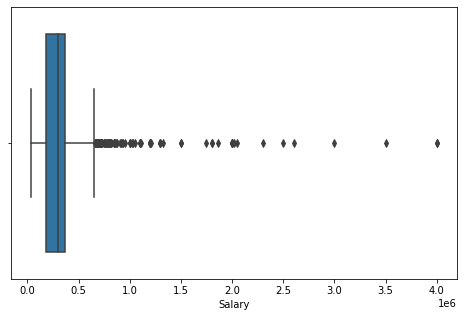

In [23]:
plt.figure(figsize=(8,5))
sns.boxplot(df['Salary'])

We observe from the box plot that as most pepole has salary in the range 1-5 lakh and very few people have salaries above 5 lakh and these salaries can be observed as outliers.

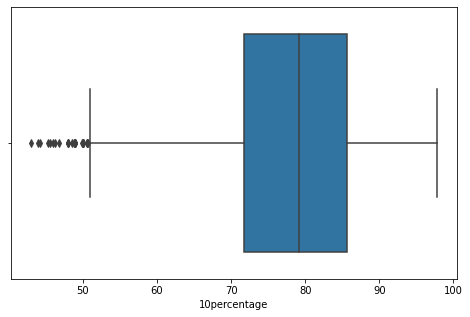

In [24]:
plt.figure(figsize=(8,5))
sns.boxplot(df['10percentage'])

We observe from the box plot that as most pepole has 10percentage in the range 70-90 percent and very few people have 10percentage less than 50 percent and hence these less than 50% can be observed as outliers.

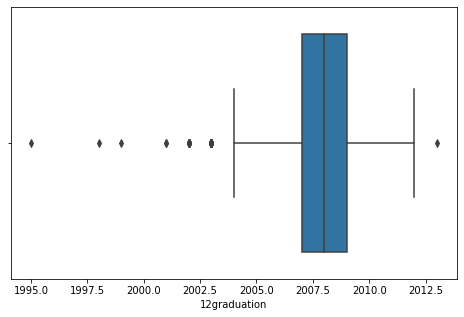

In [25]:
plt.figure(figsize=(8,5))
sns.boxplot(df['12graduation'])

We observe from the box plot that as most pepole has done there 12graduation in between the year 2006-2010 and very few people have done there 12graduation before 2005 and hence they can be observed as outliers.

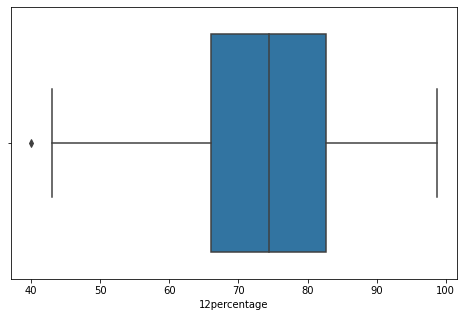

In [26]:
plt.figure(figsize=(8,5))
sns.boxplot(df['12percentage'])

We observe from the box plot that as most pepole has 12percentage in the range 65-85 percent and rare people have 12percentage around 40 percent and hence this 40% can be observed as an outlier.

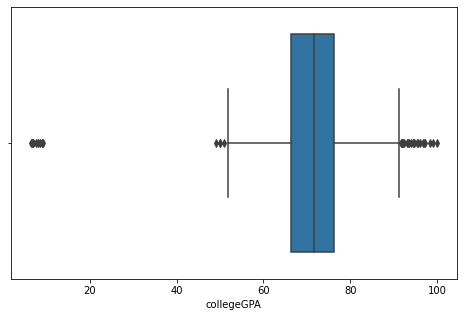

In [27]:
plt.figure(figsize=(8,5))
sns.boxplot(df['collegeGPA'])

We observe from the box plot that as most pepole has collegeGPA in the range 65-80 GPA and few people have GPA above 90 and rarely people have GPA below 55 hence in these 2 cases outliers can be observed.

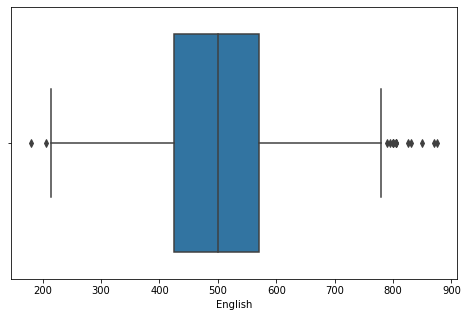

In [28]:
plt.figure(figsize=(8,5))
sns.boxplot(df['English'])

We observe from the box plot that as most pepole has English marks in the range 400-600 and few people have marks above 750 andvery few people also have marks below 350 hence in these 2 cases outliers can be observed.

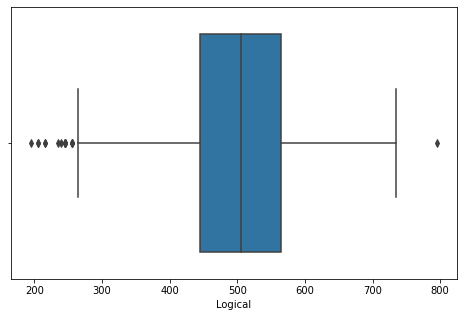

In [29]:
plt.figure(figsize=(8,5))
sns.boxplot(df['Logical'])

We observe from the box plot that as most pepole has Logical marks in the range 400-600 and few people have marks below 300 and very few people also have marks above 700 hence in these 2 cases outliers can be observed.

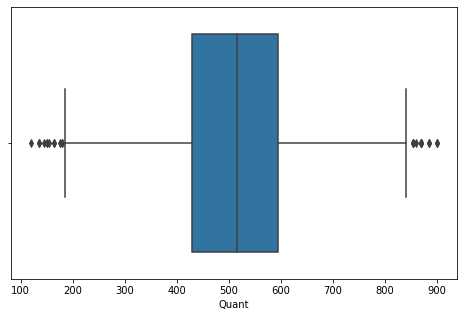

In [30]:
plt.figure(figsize=(8,5))
sns.boxplot(df['Quant'])

We observe from the box plot that as most pepole has Quant marks in the range 400-600 and few people have marks above 800 and few people also have marks below 200 hence in these 2 cases outliers can be observed.

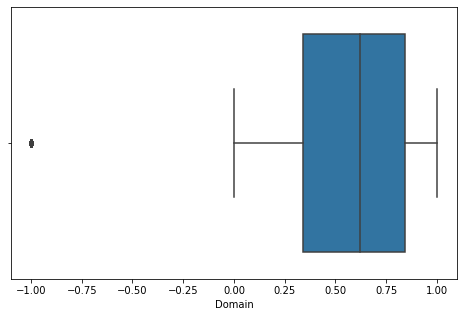

In [31]:
plt.figure(figsize=(8,5))
sns.boxplot(df['Domain'])

We observe from the box plot that domain mostly lie in the range of 0.30 to 0.9 and they are very few outliers in domain for which value is -1

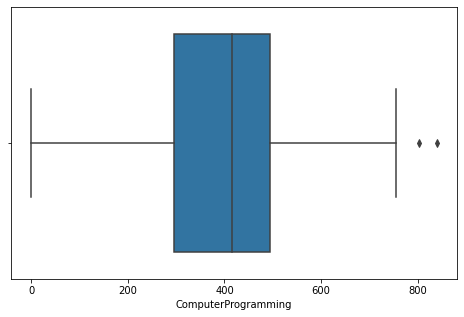

In [32]:
plt.figure(figsize=(8,5))
sns.boxplot(df['ComputerProgramming'])

We observe from the box plot that as most pepole has scores in Computer programming lies in the range of 300-500 and few outliers can be observed in the case where scores are greater than or equal to 800.

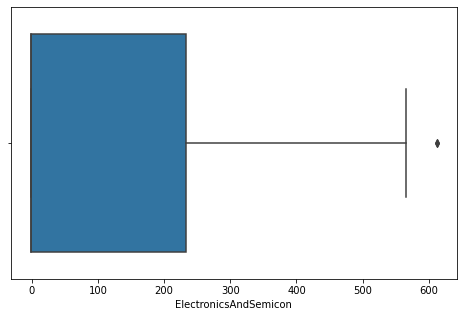

In [33]:
plt.figure(figsize=(8,5))
sns.boxplot(df['ElectronicsAndSemicon'])

We observe from the box plot that as most pepole scores in Electronics and Semicon lies in the range of 0-250 and very few outliers can be observed in the case where scores are greater than 600.

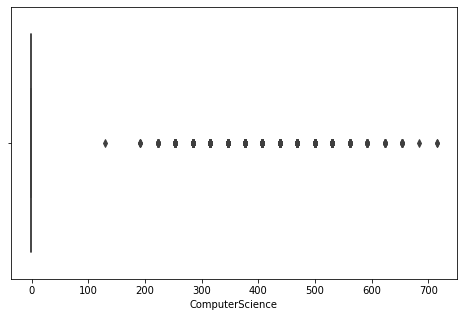

In [34]:
plt.figure(figsize=(8,5))
sns.boxplot(df['ComputerScience'])

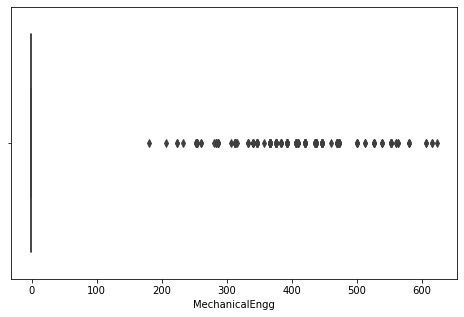

In [35]:
plt.figure(figsize=(8,5))
sns.boxplot(df['MechanicalEngg'])

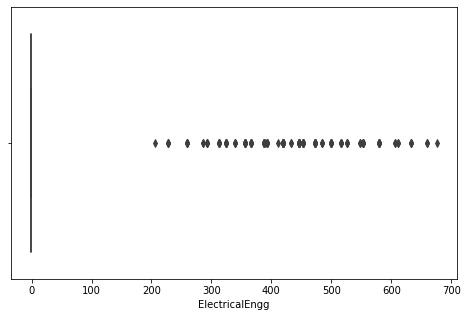

In [36]:
plt.figure(figsize=(8,5))
sns.boxplot(df['ElectricalEngg'])

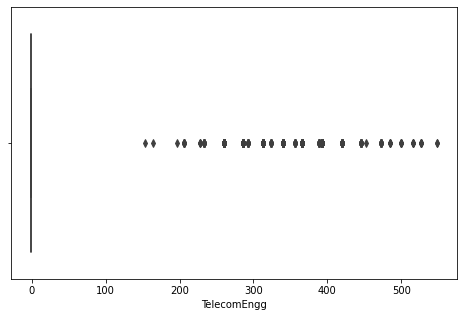

In [37]:
plt.figure(figsize=(8,5))
sns.boxplot(df['TelecomEngg'])

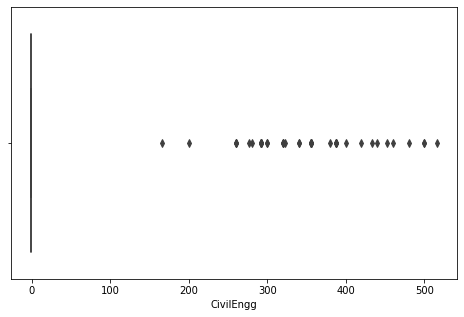

In [38]:
plt.figure(figsize=(8,5))
sns.boxplot(df['CivilEngg'])

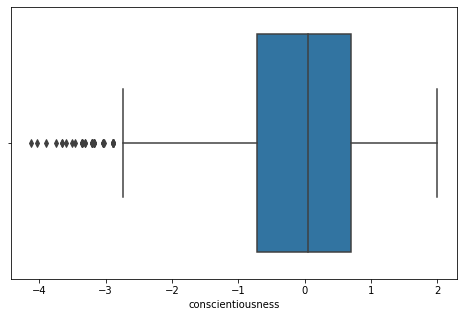

In [39]:
plt.figure(figsize=(8,5))
sns.boxplot(df['conscientiousness'])

We observe from the box plot that as Conscientiousness lies in the range of -1 to 1 and few outliers can be observed in the case where Conscientiousness lies below -2.5

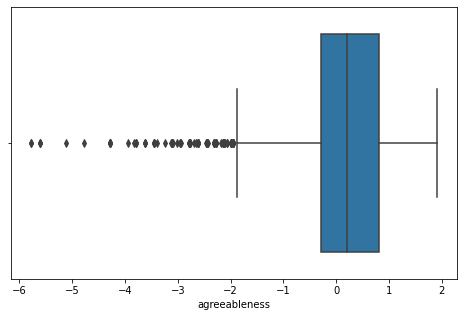

In [40]:
plt.figure(figsize=(8,5))
sns.boxplot(df['agreeableness'])

We observe from the box plot that as Agreeableness lies in the range of -0.5 to 1 and few outliers can be observed in the case where Conscientiousness lies below -2

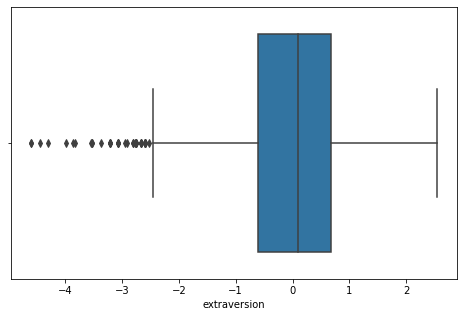

In [41]:
plt.figure(figsize=(8,5))
sns.boxplot(df['extraversion'])

We observe from the box plot that as Extraversion lies in the range of -1 to 1 and few outliers can be observed in the case where Extraversion lies below -2.5

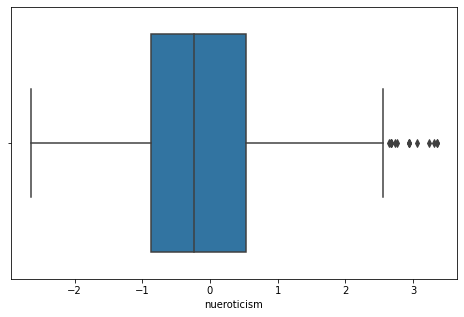

In [42]:
plt.figure(figsize=(8,5))
sns.boxplot(df['nueroticism'])

We observe from the box plot that as nueroticism lies in the range of -1 to 1 and few outliers can be observed in the case where nueroticism lies above 2.5

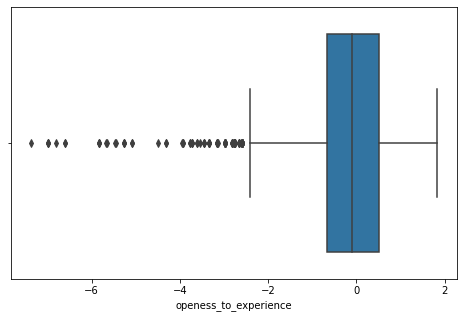

In [43]:
plt.figure(figsize=(8,5))
sns.boxplot(df['openess_to_experience'])

We observe from the box plot that as openess to experience lies in the range of -1 to 1 and some outliers can be observed in the case where openess to experience lies below -2.5

#Overall observation from boxplot
*   Boxplot makes visualization of outliers easy and convenient.
*   From the plots, it is clear that there are some outliers.



# Histogram for numerical data
The histogram is a popular graphing tool. It is used to summarize discrete or continuous data that are measured on an interval scale. It is often used to illustrate the major features of the distribution of the data in a convenient form. It is also useful when dealing with large data sets (greater than 100 observations). It can help detect any unusual observations (outliers) or any gaps in the data.

A histogram divides up the range of possible values in a data set into classes or groups. For each group, a rectangle is constructed with a base length equal to the range of values in that specific group and a length equal to the number of observations falling into that group.

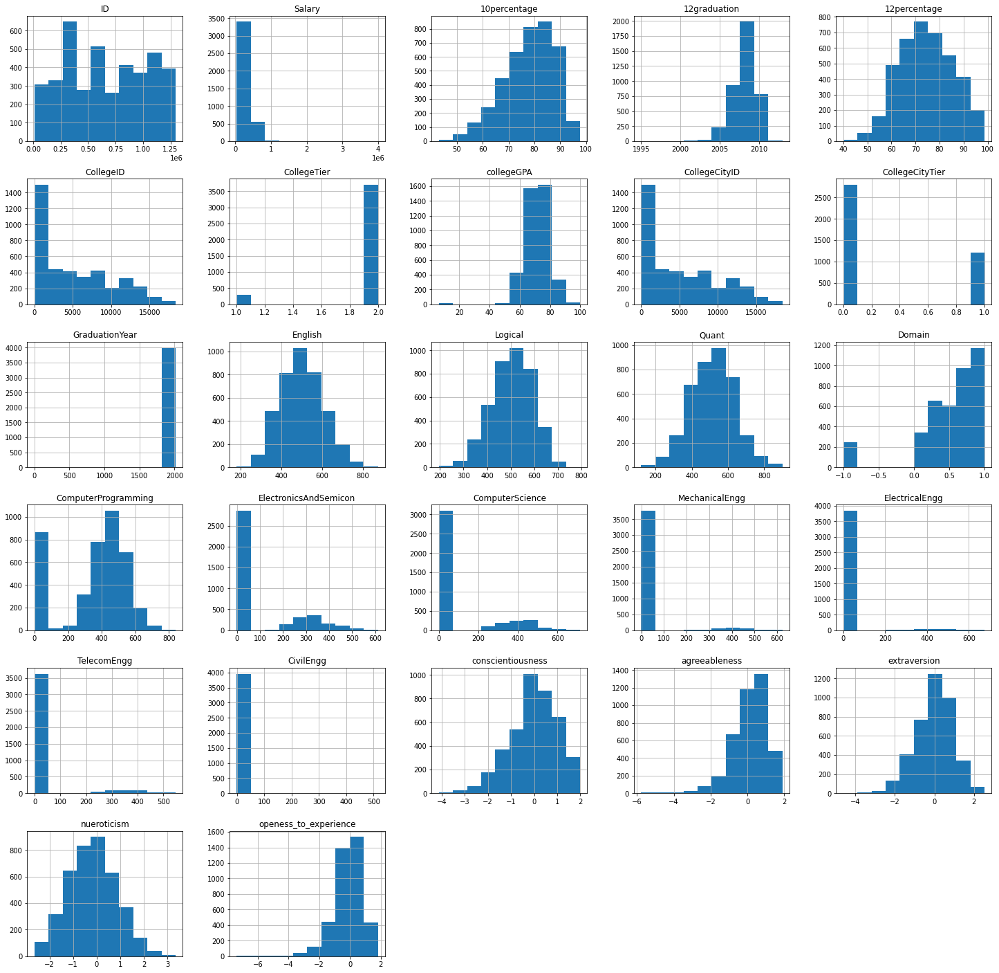

In [44]:
subset = df[numerical_data.columns]
subset.hist(figsize=(25, 25))
plt.show()

#Understand the probability and frequency distribution of each column
Frequency distribution is a curve that gives us the frequency of the occurrence of a particular data point in an experiment. This is usually the limit of a histogram of frequencies when the data points are very large and the results can be treated to be varying continuously instead of taking on discrete values.

A frequency distribution gives us an idea about how frequently a given data point occurs and how probable it is to occur.

Frequency distribution is related to probability distribution. While a frequency distribution gives the exact frequency or the number of times a data point occurs, a probability distribution gives the probability of occurrence of the given data point. When the number of test cases are large, the frequency distribution and the probability distributions are similar in shape.

#Count Plot
#10Board attribute

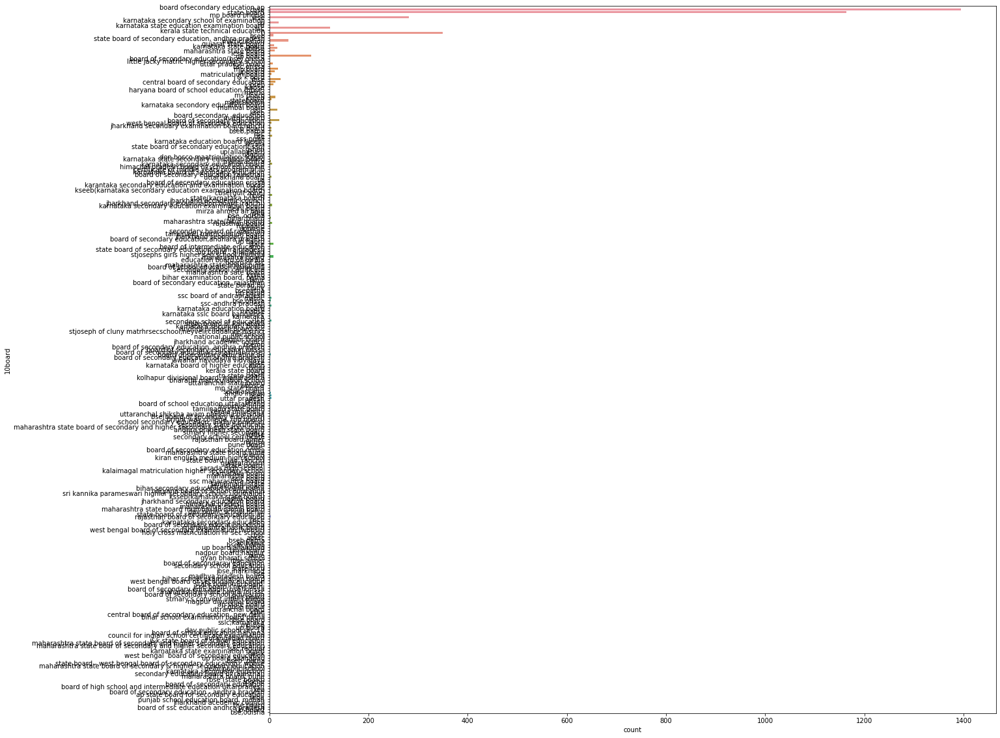

In [46]:
plt.figure(figsize=(20,20))
sns.countplot(y=df['10board'])

#12board attribute

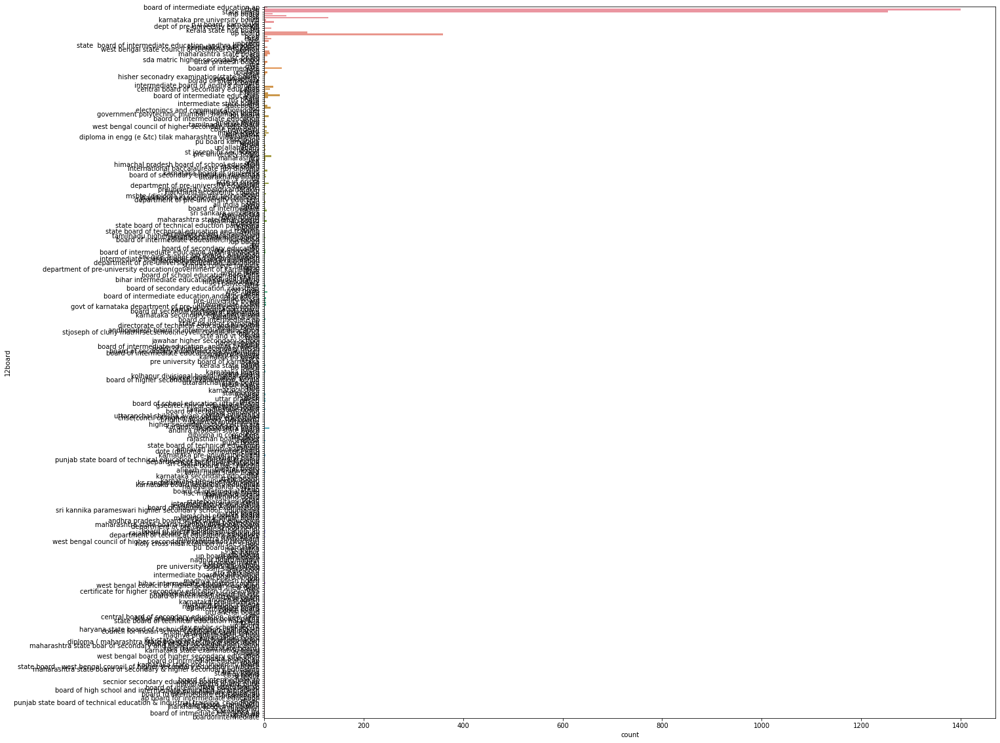

In [47]:
plt.figure(figsize=(20,20))
sns.countplot(y=df['12board'])

#College tier

Text(21.856481481481488, 0.5, 'count')

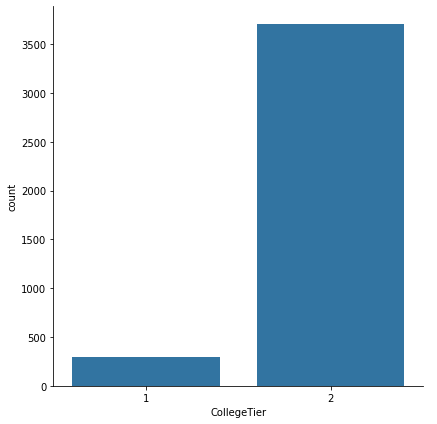

In [48]:
sns.FacetGrid(data=df,size=6).map(sns.countplot,"CollegeTier").add_legend()
plt.ylabel("count")

#Step 4

#Bivariate Analysis
#Pair Plot


<Figure size 432x288 with 0 Axes>

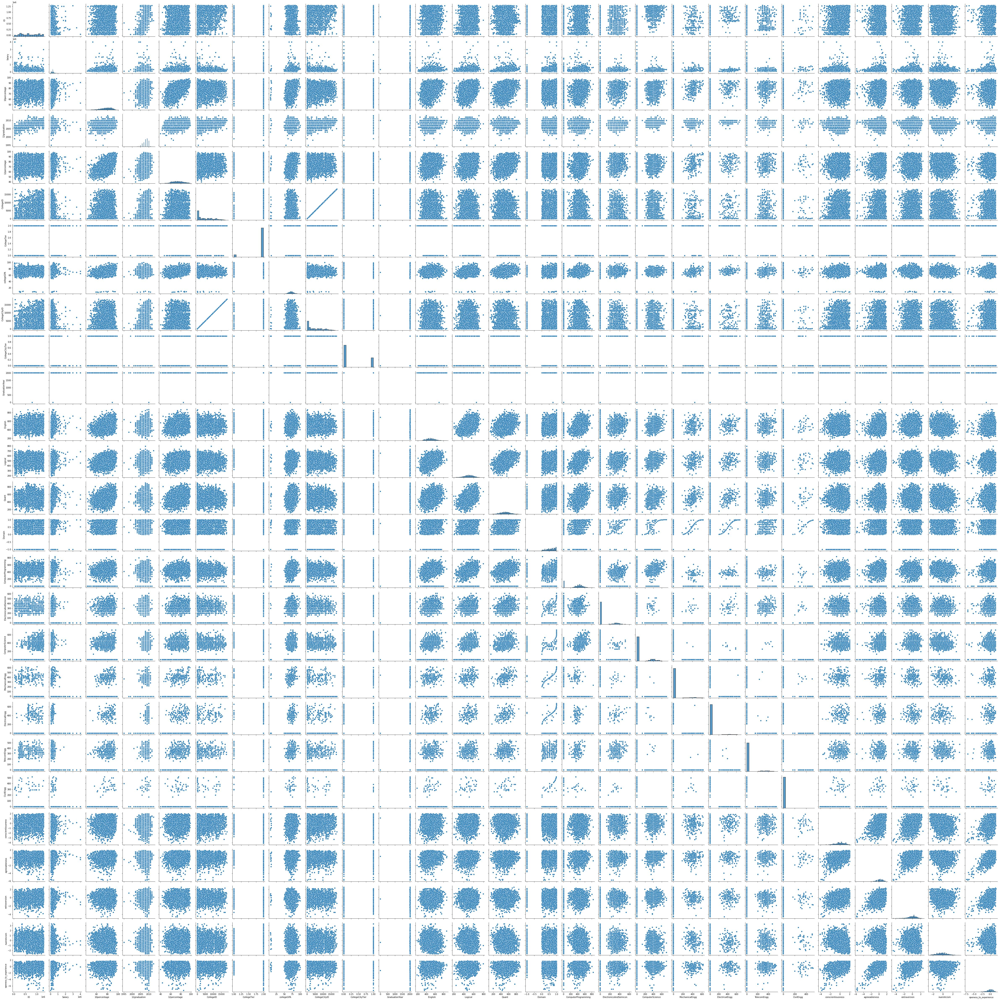

In [49]:
plt.figure()
sns.pairplot(numerical_data)
plt.show()

#Pair plot of personality scores by Degree

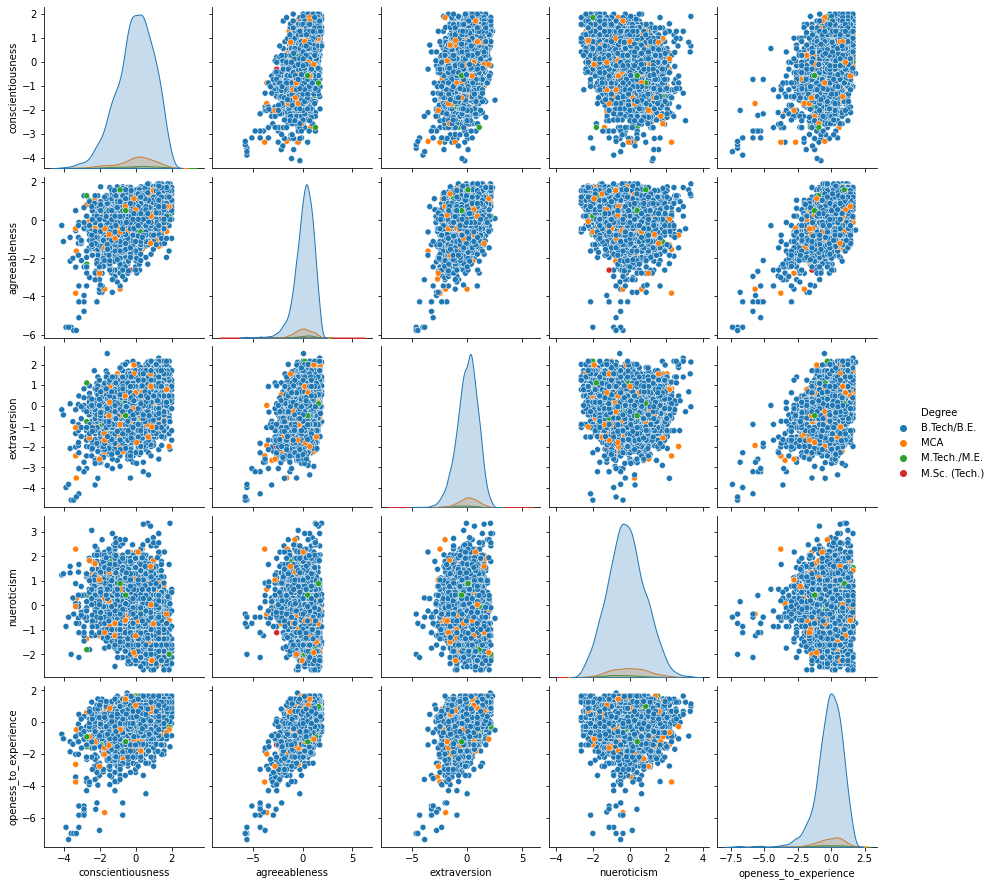

In [50]:
Personality_Scores = df[['conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience','Degree']]
sns.pairplot(data=Personality_Scores,hue='Degree')

#Pair plot of amcat scores by Degree

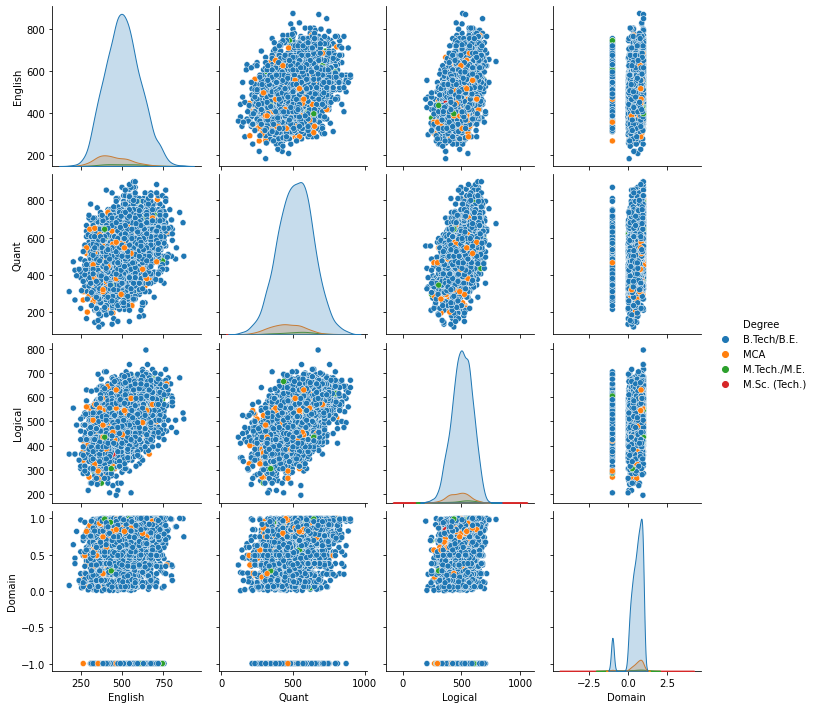

In [51]:
amcat_Scores = df[['English','Quant','Logical','Domain','Degree']]
sns.pairplot(data=amcat_Scores,hue="Degree")

#Hexplot for numerical data

<Figure size 432x288 with 0 Axes>

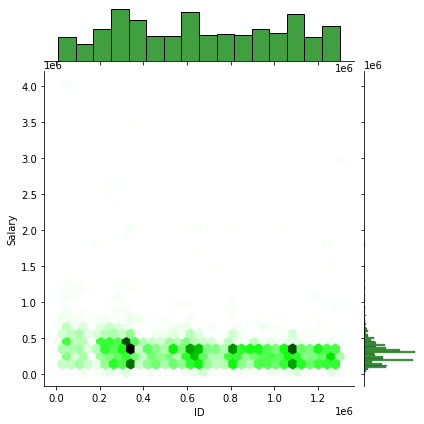

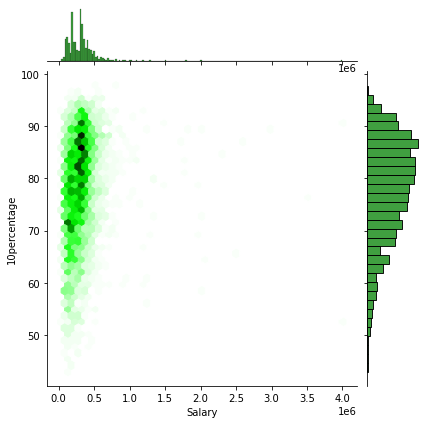

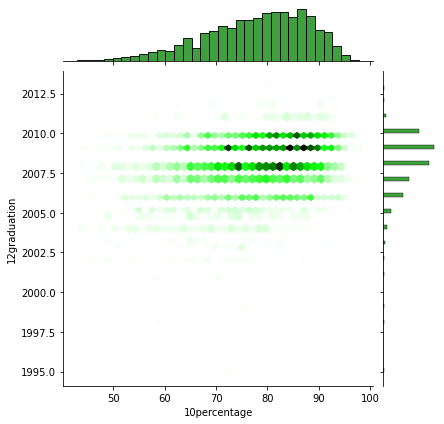

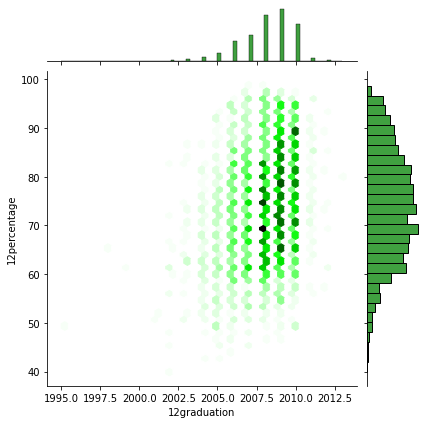

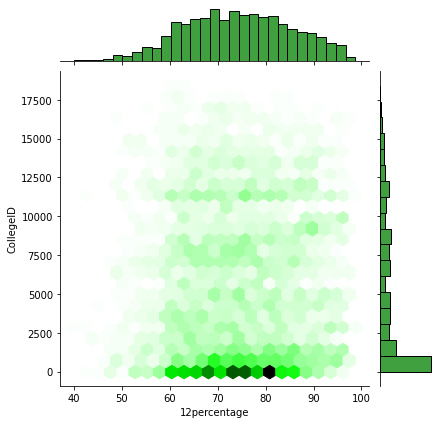

...

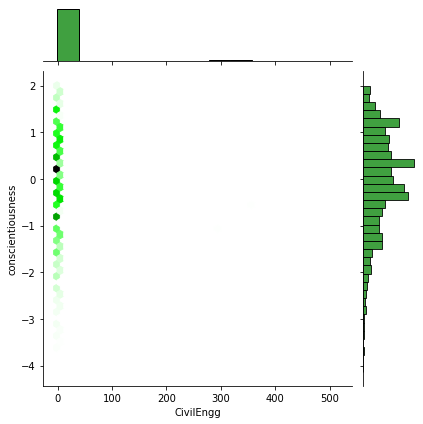

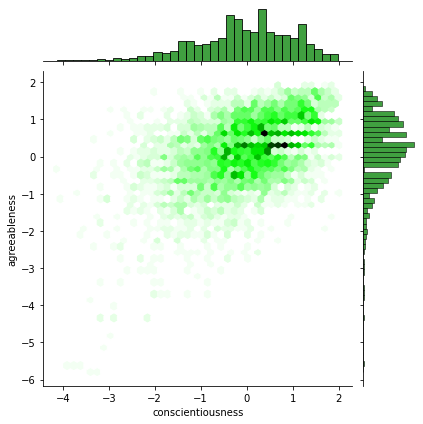

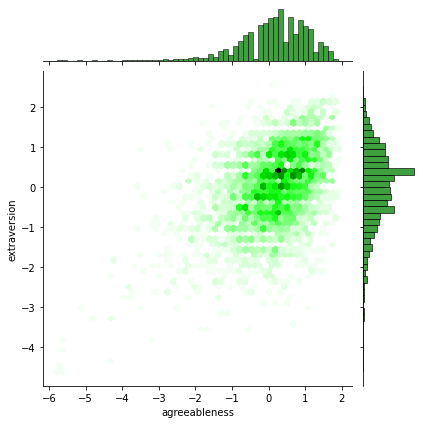

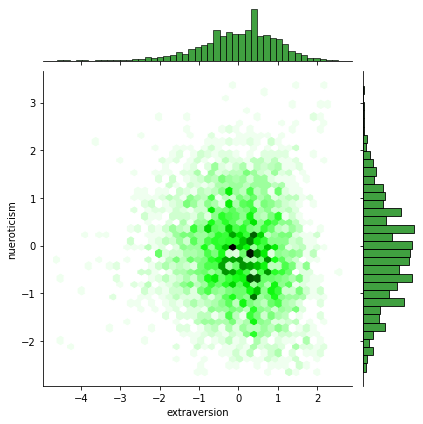

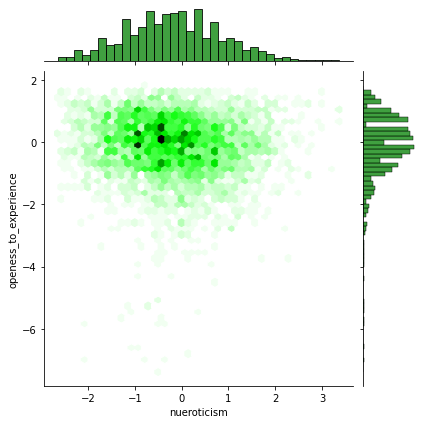

In [52]:
plt.figure()
for i in range(len(numerical_data.columns)-1):
    sns.jointplot(x = numerical_data.columns[i], y = numerical_data.columns[i+1], data=numerical_data, kind='hex', color='green')
    plt.show()

#Scatter Plot for numerical data


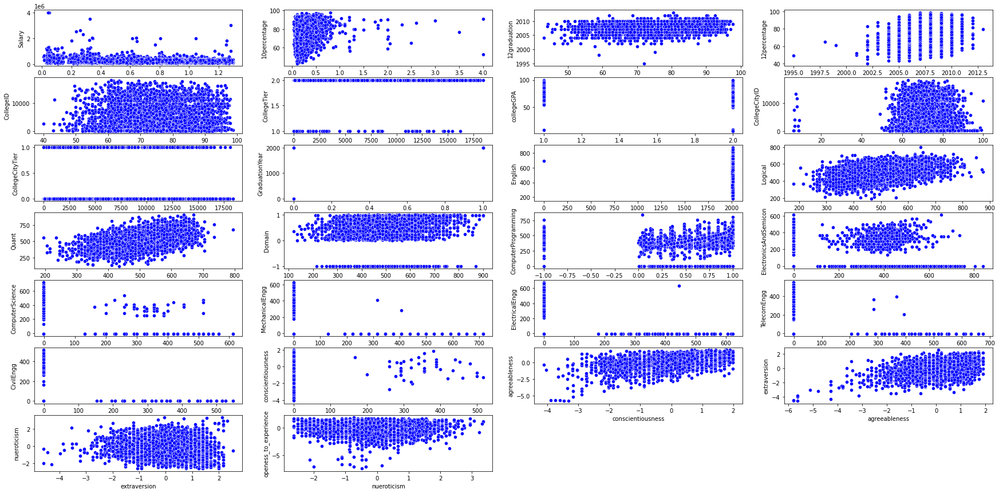

In [53]:
plt.subplots(figsize=(30, 30))
count = 1
for i in range(len(numerical_data.columns)-1):
    plt.subplot(14, 4, count)
    sns.scatterplot(x=numerical_data.columns[i], y=numerical_data.columns[i+1],
                        data=numerical_data, color='blue')
    count += 1
plt.show()

Observations from scatter plot for numerical data:

We can observe from the plot that English and Logical has a weak positive correlation.

#Correlation Plot

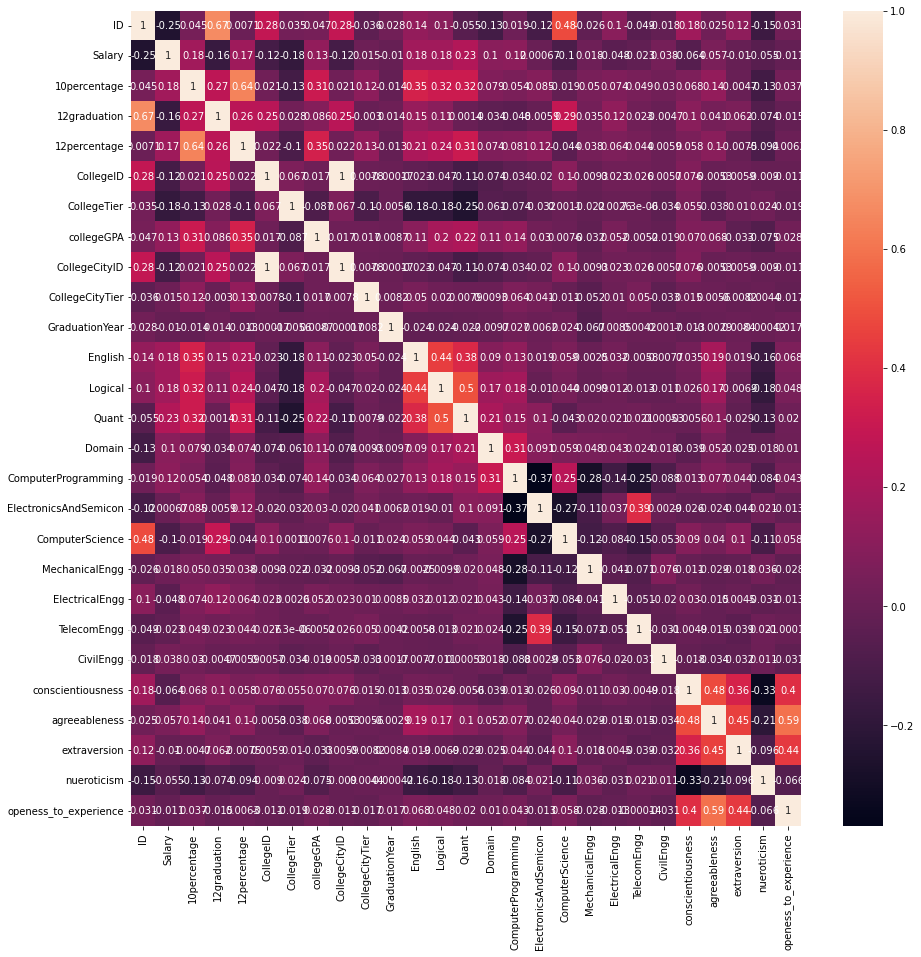

In [54]:
plt.figure(figsize=(15,15))
sns.heatmap(numerical_data.corr(),annot=True)

#Categorical data

In [55]:

categorical_data.head()

,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh


In [56]:
categorical_data['Degree'].unique()

array(['B.Tech/B.E.', 'MCA', 'M.Tech./M.E.', 'M.Sc. (Tech.)'],
      dtype=object)

#Countplots
#Gender attribute 

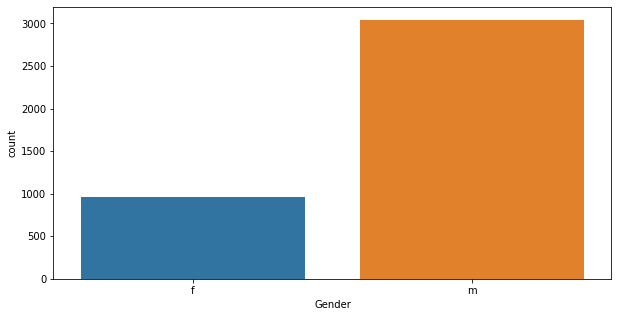

In [57]:
plt.figure(figsize=(10,5))
sns.countplot(categorical_data['Gender'])

#Degree attribute

Text(21.328240740740746, 0.5, 'count')

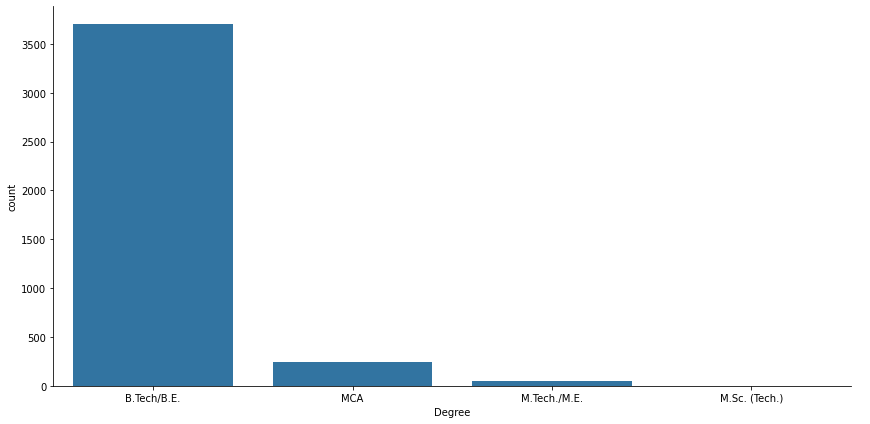

In [58]:
sns.FacetGrid(data=categorical_data,size=6,aspect=2).map(sns.countplot,"Degree").add_legend()
plt.ylabel("count")

#Specalization attribute

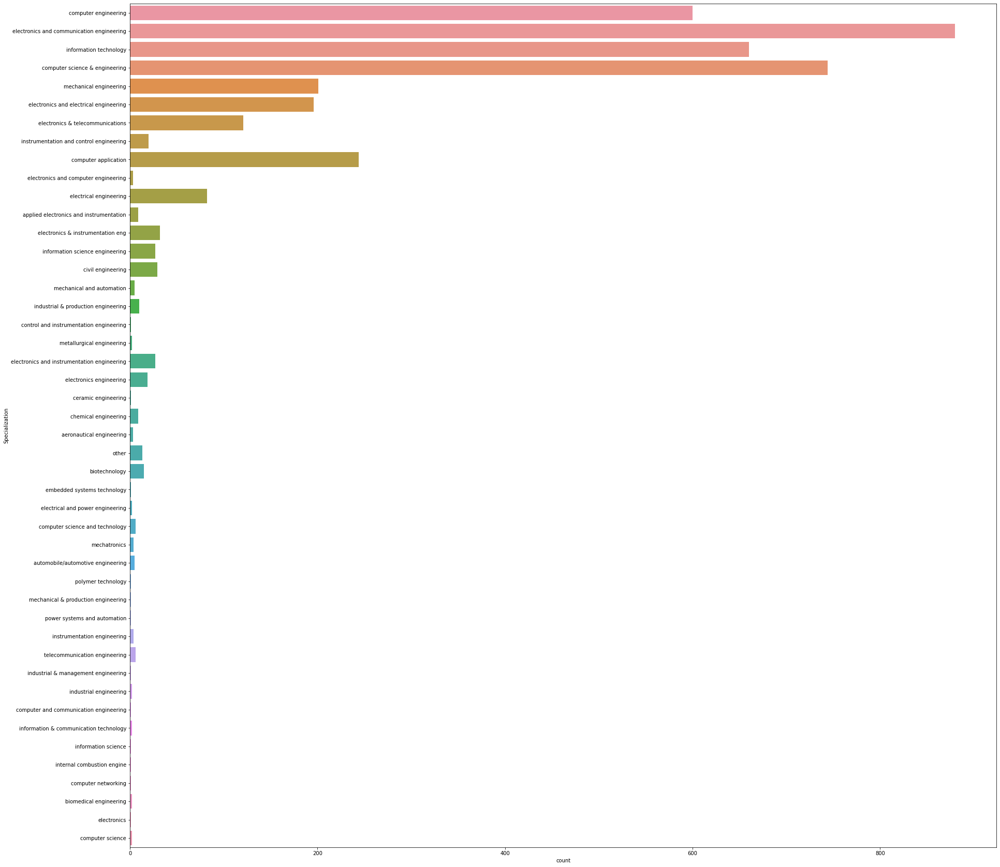

In [59]:
plt.figure(figsize=(30,30))
sns.countplot(y=categorical_data['Specialization'])


#Box plot

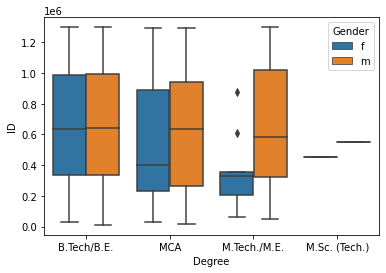

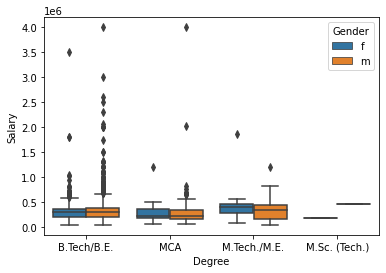

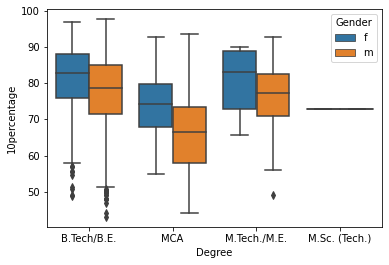

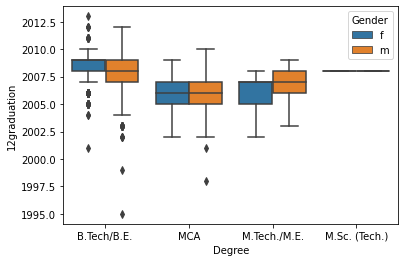

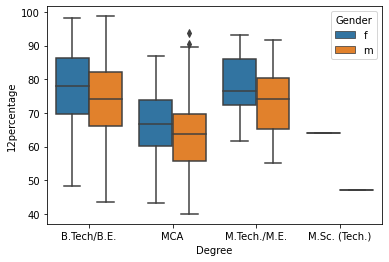

...

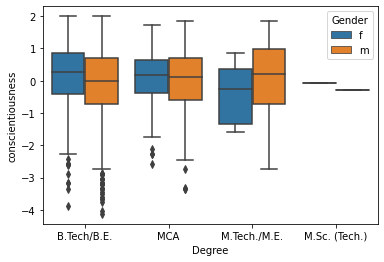

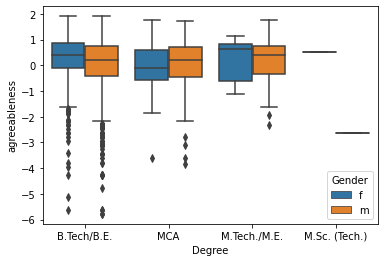

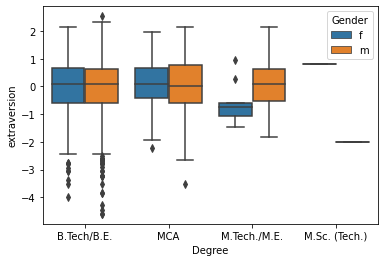

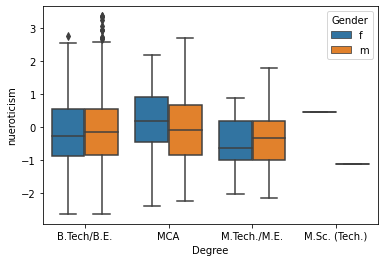

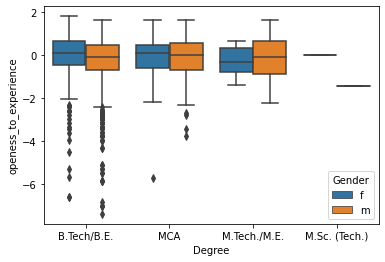

In [60]:
for j in range(len(numerical_data.columns)):
    plt.figure()
    sns.boxplot(data = df, x=categorical_data['Degree'], y=numerical_data.columns[j], hue=categorical_data['Gender'])
    plt.show()

#Step 5&6

#Research Question
1. Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.

In [65]:
df2 = pd.DataFrame(df, columns=['Specialization', 'Designation', 'Salary', 'GraduationYear','DOJ','Gender'])
df2['JoiningYear'] = pd.DatetimeIndex(df['DOJ']).year
cse_df = df2.loc[((df2.Specialization == 'computer engineering')|
    (df2.Specialization== 'computer science & engineering')|
    (df2.Specialization == 'computer science and technology') |
    (df2.Specialization == 'computer science')) &
    ((df2.Designation == 'programmer analyst')|
    (df2.Designation == 'software engineer')|
     (df2.Designation == 'hardware engineer')|
     (df2.Designation == 'associate engineer')|
     (df2.Designation == 'software engineer associate')  ) & ((df2.JoiningYear - df2.GraduationYear) <= 1)
    ]

df3 = cse_df.drop(['DOJ'], axis = 1)
df3.head(5)

,Specialization,Designation,Salary,GraduationYear,Gender,JoiningYear
20,computer engineering,software engineer,320000.0,2010,f,2010
24,computer science & engineering,programmer analyst,335000.0,2014,m,2014
31,computer science & engineering,software engineer,340000.0,2014,m,2014
36,computer engineering,software engineer,270000.0,2013,f,2013
44,computer engineering,programmer analyst,380000.0,2011,f,2012


In [66]:
df3.Salary.count()

298

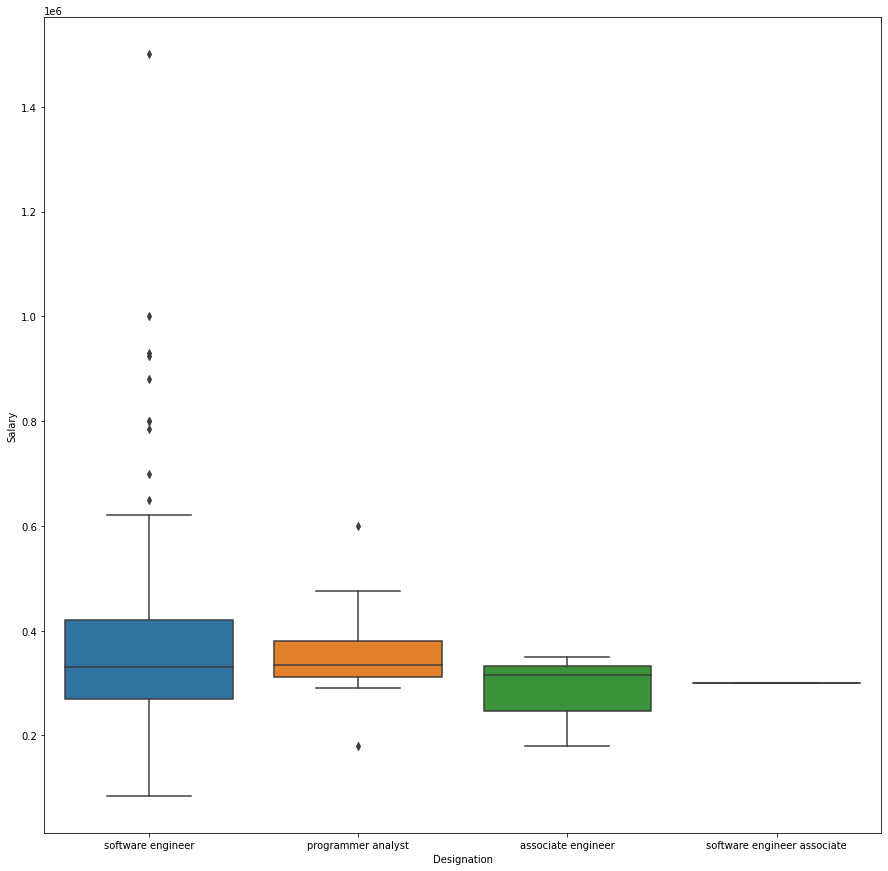

In [67]:
plt.figure(figsize=(15,15))
sns.boxplot(x=df3.Designation, y=df3.Salary, data=df3)
plt.show()

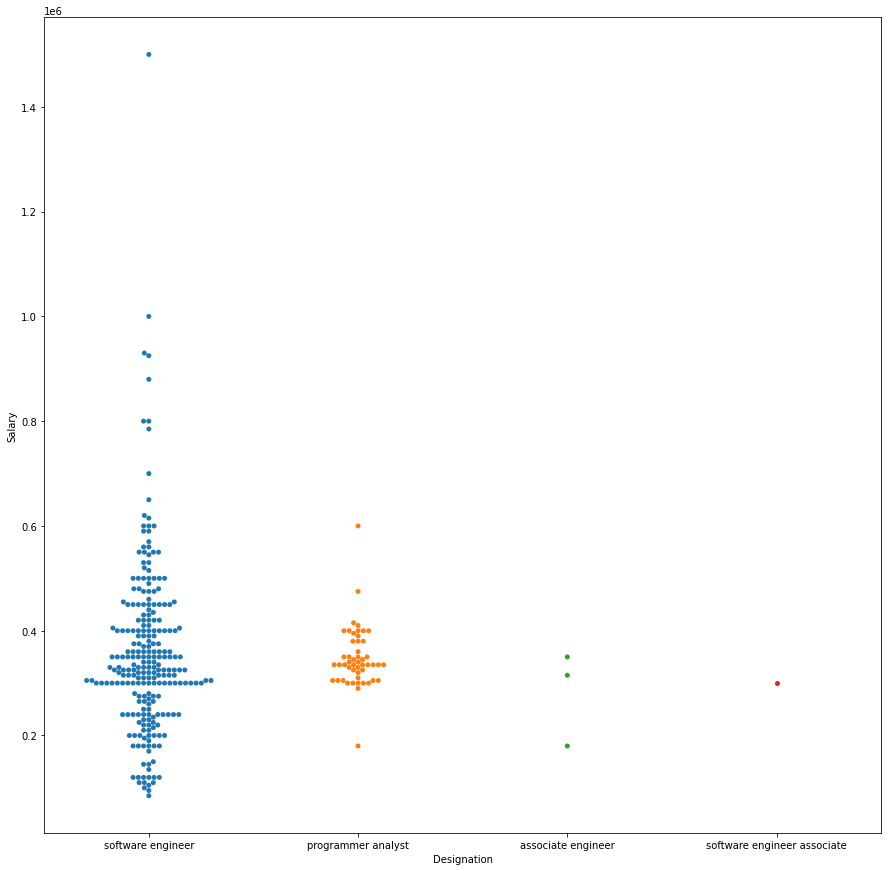

In [68]:
plt.figure(figsize=(15,15))
sns.swarmplot(x=df3.Designation,y=df3.Salary,data=df3)
plt.show()

#Observation:
From the above plots we observe that on an average the salary is around 3lakhs and we also notice that they are some employees who earn more than 3lakhs.

So, inorder to conclude we need to make hypothesis regarding this statement.
#Testing the hypothesis:
Null Hypothesis:  Rs 300000

ALternate Hypothesis:  > Rs 300000

In [69]:
# Sample and population parameters
print("Sample size = {}".format(df.Salary.count()))
print("Sample mean = {}".format(df3.Salary.mean()))
print("Population mean = 300000")
print("sample standard deviation = {}".format(df3.Salary.std()))

Sample size = 3998
Sample mean = 356442.95302013424
Population mean = 300000
sample standard deviation = 152619.43526589248


In [70]:
# Calculating the z-critical value for one tail.
confidence_level = 0.95
alpha = 1 - confidence_level
z_critical = norm.ppf(1 - alpha) 
print("z-critical value = {}".format(z_critical))

z-critical value = 1.6448536269514722


In [71]:
# Calculating z-score
def z_score(sample_size, sample_mean, pop_mean, pop_std):
    numerator = sample_mean - pop_mean
    denomenator = pop_std / sample_size**0.5
    return numerator / denomenator
z = z_score(df.Salary.count(), df3.Salary.mean(), 300000, df3.Salary.std())
print("z-score = {}".format(z))

z-score = 23.384133409629555


In [72]:
if(np.abs(z) > z_critical):
    print("Reject Null Hypothesis")
else:
    print("Fail to reject Null Hypothesis")

Reject Null Hypothesis


In [73]:
# Conclusion using p test

p_value = 2 * (1.0 - norm.cdf(np.abs(z)))

print("p_value = ", p_value)

if(p_value < alpha):
    print("Reject Null Hypothesis")
else:
    print("Fail to reject Null Hypothesis")

p_value =  0.0
Reject Null Hypothesis


#Observation & Conclusion:
From the hypothesis test,after rejecting the NULL Hypothesis , we can conclude that after doing the Computer Science Engineering if one take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer then the person can earn more than 3 lakhs as a fresh graduate.

# 2nd research question
Is there a relationship between gender and specialisation? (i.e. Does the preference of
Specialisation depend on the Gender?)

# Relationship between Gender and Specialization
To find the relation lets Plotting the gender and specialization and analyse it visually


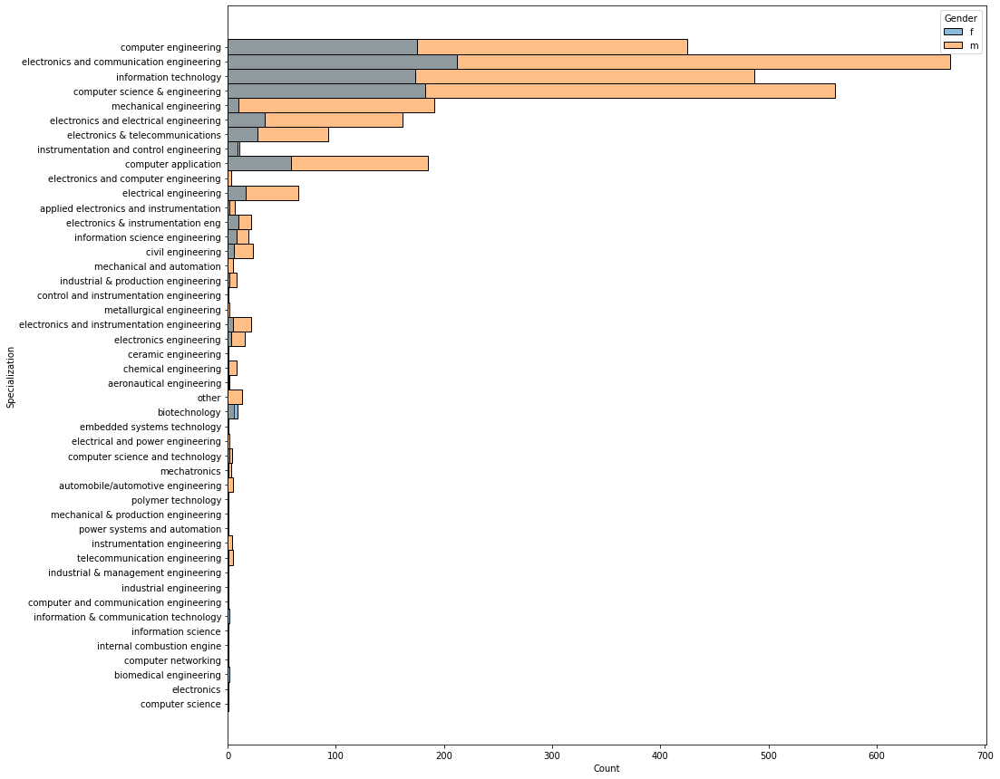

In [74]:
plt.figure(figsize=(15,15))
sns.histplot(y=df.Specialization, hue=df.Gender)
plt.show()

In [75]:
# defining the cross table
cross_tab = pd.crosstab(df['Specialization'],df['Gender'])
cross_tab

Gender,f,m
Specialization,,
aeronautical engineering,1,2
applied electronics and instrumentation,2,7
automobile/automotive engineering,0,5
biomedical engineering,2,0
biotechnology,9,6
ceramic engineering,0,1
chemical engineering,1,8
civil engineering,6,23
computer and communication engineering,0,1


#In order to confirm relation between them let's perform Chi-Square Test

Null Hypothesis = the categorical variables are independent.

Alternate Hypothesis  = the categorical variables are dependent.

In [76]:
from scipy.stats import chi2_contingency

stat, p, dof, expected = chi2_contingency(cross_tab)

alpha = 0.05
print("p value = {}".format(p))
if p <= alpha:
    print("{} <= {}".format(p,alpha))
    print("The categorical variables are dependent. So reject Null Hypothesis")
else:
    print("The categorical variables are independent")

p value = 1.2453868176977011e-06
1.2453868176977011e-06 <= 0.05
The categorical variables are dependent. So reject Null Hypothesis


#Observations & Conclusion:
since, the null hypothesis is rejected. We can conclude that gender and specialization attributes are dependendent on each other.

#Step 7


#Feature Transformation:
#Column Standardization for Numerical Features

In [77]:
from sklearn.preprocessing import StandardScaler
numerical_data[['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']] = StandardScaler().fit_transform(df[['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']])
numerical_data

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,-1.268535,0.527947,0.647233,-0.657765,1.939676,-0.836346,0.283282,0.797646,-0.836346,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,0.983466,0.707581,0.550939,1.512658,-0.304966
1,-0.230991,0.904045,0.758921,-0.657765,0.957729,0.135401,0.283282,-0.174641,0.135401,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,-0.676367,0.246801,1.300083,0.060978,0.993910
2,0.404233,0.081332,0.718307,1.156686,-0.569744,-1.060644,0.283282,-0.181988,-1.060644,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,0.301041,1.661318,0.169167,-0.693995,0.803821
3,-1.091347,3.724775,0.779227,-0.657765,0.830439,0.367196,-3.530054,0.386200,0.367196,1.526071,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,0.081894,0.210589,-0.364495,-0.237001,-0.775129
4,-0.881871,-0.506320,0.007570,-0.052948,0.212176,1.293542,0.283282,0.295584,1.293542,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,-0.819775,-0.452174,-1.127304,0.258734,0.008542
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,-1.695828,-0.130223,-2.623172,-1.262582,-1.724441,0.231409,0.283282,-1.222849,0.231409,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,-0.068416,0.210589,0.245794,0.812774,-0.775129
3994,0.245025,-0.976442,1.225977,0.551869,1.685097,-0.057033,0.283282,0.711928,-0.057033,1.526071,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,-0.257520,0.777245,0.976964,0.941813,0.043465
3995,-0.847824,0.057826,0.399491,-0.052948,-0.815231,0.964072,0.283282,-0.181988,0.964072,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,-1.495978,-1.777487,-1.584968,-1.140864,-0.618474
3996,0.780115,-0.506320,0.080674,1.156686,-0.416997,-0.870085,0.283282,-0.130557,-0.870085,1.526071,...,1.981485,-0.244363,-0.199587,-0.313347,-0.100503,-0.117807,-0.106828,-0.477071,-0.190746,0.043465


# Feature Transformatin For Categorical data 
If more than 2 categories, use dummy variables. 

Otherwise convert the feature to Binary.

In [78]:
#for gender we will convert to binary
# Separate labels and features

from sklearn.preprocessing import LabelEncoder
X = df.drop(columns=['Gender'])
y = df['Gender']
# Convert the M to 1 and F to 0
label = LabelEncoder()
y = label.fit_transform(y)
y[:20]

array([0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0])

In [79]:
for x in categorical_data.columns:
    #prinfting unique values
    print(x ,':', len(categorical_data[x].unique()))

Designation : 419
JobCity : 339
Gender : 2
10board : 275
12board : 340
Degree : 4
Specialization : 46
CollegeState : 26


In [80]:
#One hot ecoding for 12board column
categorical_data['12board'].unique()


array(['board of intermediate education,ap', 'cbse', 'state board',
       'mp board', 'isc', 'icse', 'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', '0', 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc', 'isc board',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'isce', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate s

In [81]:
replace_list_state=['board of intermediate education,ap', 'state board',
       'mp board',  'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate state board', 'stateboard', 'hsc',
       'electonincs and communication(dote)', 'karnataka pu board',
       'government polytechnic mumbai , mumbai board', 'pu board',
       'baord of intermediate education', 'apbie', 'andhra board',
       'tamilnadu stateboard',
       'west bengal council of higher secondary education',
       'cbse,new delhi', 'u p board', 'intermediate', 'biec,patna',
       'diploma in engg (e &tc) tilak maharashtra vidayapeeth',
       'hsc pune', 'pu board karnataka', 'kerala', 'gsheb',
       'up(allahabad)', 'nagpur', 'st joseph hr sec school',
       'pre university board', 'ipe', 'maharashtra', 'kea', 'apsb',
       'himachal pradesh board of school education', 'staae board',
       'international baccalaureate (ib) diploma', 'nios',
       'karnataka board of university',
       'board of secondary education rajasthan', 'uttarakhand board',
       'ua', 'scte vt orissa', 'matriculation',
       'department of pre-university education', 'wbscte',
       'preuniversity board(karnataka)', 'jharkhand accademic council',
       'bieap', 'msbte (diploma in computer technology)',
       'jharkhand acamedic council (ranchi)',
       'department of pre-university eduction', 'biec',
       'sjrcw', ' board of intermediate', 'msbte',
       'sri sankara vidyalaya', 'chse, odisha', 'bihar board',
       'maharashtra state(latur board)', 'rajasthan board', 'mpboard',
       'state board of technical eduction panchkula', 'upbhsie', 'apbsc',
       'state board of technical education and training',
       'secondary board of rajasthan',
       'tamilnadu higher secondary education board',
       'jharkhand academic council',
       'board of intermediate education,hyderabad', 'up baord', 'pu',
       'dte', 'board of secondary education', 'pre-university',
       'board of intermediate education,andhra pradesh',
       'up board , allahabad', 'srv girls higher sec school,rasipuram',
       'intermediate board of education,andhra pradesh',
       'intermediate board examination',
       'department of pre-university education, bangalore',
       'stmiras college for girls', 'mbose',
       'department of pre-university education(government of karnataka)',
       'dpue', 'msbte pune', 'board of school education harayana',
       'sbte, jharkhand', 'bihar intermediate education council, patna',
       'higher secondary', 's j polytechnic', 'latur',
       'board of secondary education, rajasthan', 'jyoti nivas', 'pseb',
       'biec-patna', 'board of intermediate education,andra pradesh',
       'chse,orissa', 'pre-university board', 'mp', 'intermediate board',
       'govt of karnataka department of pre-university education',
       'karnataka education board',
       'board of secondary school of education', 'pu board ,karnataka',
       'karnataka secondary education board', 'karnataka sslc',
       'board of intermediate ap', 'u p', 'state board of karnataka',
       'directorate of technical education,banglore', 'matric board',
       'andhpradesh board of intermediate education',
       'stjoseph of cluny matrhrsecschool,neyveli,cuddalore district',
       'bte up', 'scte and vt ,orissa', 'hbsc',
       'jawahar higher secondary school', 'nagpur board', 'bsemp',
       'board of intermediate education, andhra pradesh',
       'board of higher secondary orissa',
       'board of secondary education,rajasthan(rbse)',
       
       'board of intermediate education:ap,hyderabad', 'science college',
       'karnatak pu board', 'aissce', 'pre university board of karnataka',
       'bihar', 'kerala state board', 'uo board', 
       'karnataka board', 'tn state board',
       'kolhapur divisional board, maharashtra',
       'jaycee matriculation school',
       'board of higher secondary examination, kerala',
       'uttaranchal state board', 'intermidiate', 'bciec,patna', 'bice',
       'karnataka state', 'state broad', 'wbbhse', 'gseb',
       'uttar pradesh', 'ghseb', 'board of school education uttarakhand',
       'gseb/technical education board', 'msbshse,pune',
       'tamilnadu state board', 'board of technical education',
       'kerala university', 'uttaranchal shiksha avam pariksha parishad',
       'chse(concil of higher secondary education)',
       'bright way college, (up board)', 'board of intermidiate',
       'higher secondary state certificate', 'karanataka secondary board',
       'maharashtra board', 'cgbse', 'diploma in computers', 'bte,delhi',
       'rajasthan board ajmer', 'mpbse', 'pune board',
       'state board of technical education', 'gshseb',
       'amravati divisional board', 'dote (diploma - computer engg)',
       'karnataka pre-university board', 'jharkhand board',
       'punjab state board of technical education & industrial training',
       'department of technical education',
       'sri chaitanya junior kalasala', 'state board (jac, ranchi)',
       'aligarh muslim university', 'tamil nadu state board', 'hse',
       'karnataka secondary education', 'state board ',
       'karnataka pre unversity board',
       'ks rangasamy institute of technology',
       'karnataka board secondary education', 'narayana junior college',
       'bteup', 'board of intermediate(bie)', 'hsc maharashtra board',
       'tamil nadu state', 'uttrakhand board', 'psbte',
       'stateboard/tamil nadu', 'intermediate council patna',
       'technical board, punchkula', 'board of intermidiate examination',
       'sri kannika parameswari highier secondary school, udumalpet',
       'ap board', 'nashik board', 'himachal pradesh board',
       'maharashtra satate board',
       'andhra pradesh board of secondary education',
       'tamil nadu polytechnic',
       'maharashtra state board mumbai divisional board',
       'department of pre university education',
       'dav public school,hehal', 'board of intermediate education, ap',
       'rajasthan board of secondary education',
       'department of technical education, bangalore', 'chse,odisha',
       'maharashtra nasik board',
       'west bengal council of higher secondary examination (wbchse)',
       'holy cross matriculation hr sec school', 'cbsc',
       'pu  board karnataka', 'biec patna', 'kolhapur', 'bseb, patna',
       'up board allahabad', 'nagpur board,nagpur', 'diploma(msbte)',
       'dav public school', 'pre university board, karnataka',
       'ssm srsecschool', 'state bord', 'jstb,jharkhand',
       'intermediate board of education', 'mp board bhopal', 'pub',
       'madhya pradesh board', 'bihar intermediate education council',
       'west bengal council of higher secondary eucation',
        'mpc',
       'certificate for higher secondary education (chse)orissa',
       'maharashtra state board for hsc',
       'board of intermeadiate education', 'latur board',
       'andhra pradesh', 'karnataka pre-university',
       'lucknow public college', 'nagpur divisional board',
       'ap intermediate board', 'cgbse raipur', 'uttranchal board',
       'jiec', 
       'bihar school examination board patna',
       'state board of technical education harayana', 'mp-bse',
       'up bourd', 'dav public school sec 14',
       'haryana state board of technical education chandigarh',
       'council for indian school certificate examination',
       'jaswant modern school', 'madhya pradesh open school',
       'aurangabad board', 'j&k state board of school education',
       'diploma ( maharashtra state board of technical education)',
       'board of technicaleducation ,delhi',
       'maharashtra state boar of secondary and higher secondary education',
       'hslc (tamil nadu state board)',
       'karnataka state examination board', 'puboard', 'nasik',
       'west bengal board of higher secondary education',
       'up board,allahabad', 'board of intrmediate education,ap', 
       'karnataka state pre- university board',
       'state board - west bengal council of higher secondary education : wbchse',
       'maharashtra state board of secondary & higher secondary education',
       'biec, patna', 'state syllabus', 'cbse board', 'scte&vt',
       'board of intermediate,ap',
       'secnior secondary education board of rajasthan',
       'maharashtra board, pune', 'rbse (state board)',
       'board of intermidiate education,ap',
       'board of high school and intermediate education uttarpradesh',
       'higher secondary education',
       'board fo intermediate education, ap', 'intermedite',
       'ap board for intermediate education', 'ahsec',
       'punjab state board of technical education & industrial training, chandigarh',
       'state board - tamilnadu', 'jharkhand acedemic council',
       'scte & vt (diploma)', 'karnataka pu',
       'board of intmediate education ap', 'up-board',
       'boardofintermediate']

In [82]:
#replacing the redundant values of the 12board column with 'state','cbse','icse' and 'n/a'
for i in replace_list_state:
    df['12board'].replace(i,'state',inplace=True)

replace_list_cbse=['cbse', 
       'all india board', 
       'central board of secondary education, new delhi', 'cbese']
for i in replace_list_cbse:
    df['12board'].replace(i,'cbse',inplace=True)

replace_list_icse=[ 'isc', 'icse', 'isc board', 'isce', 'cicse',
       'isc board , new delhi']
for i in replace_list_icse:
    df['12board'].replace(i,'icse',inplace=True)

df['12board'].replace(0,'n/a',inplace=True)

df['12board'].unique()

array(['state', 'cbse', 'icse', '0', 'andhra pradesh state board',
       'up bord', 'gujarat board', 'intermideate'], dtype=object)

In [83]:
df['Degree'].unique()

array(['B.Tech/B.E.', 'MCA', 'M.Tech./M.E.', 'M.Sc. (Tech.)'],
      dtype=object)

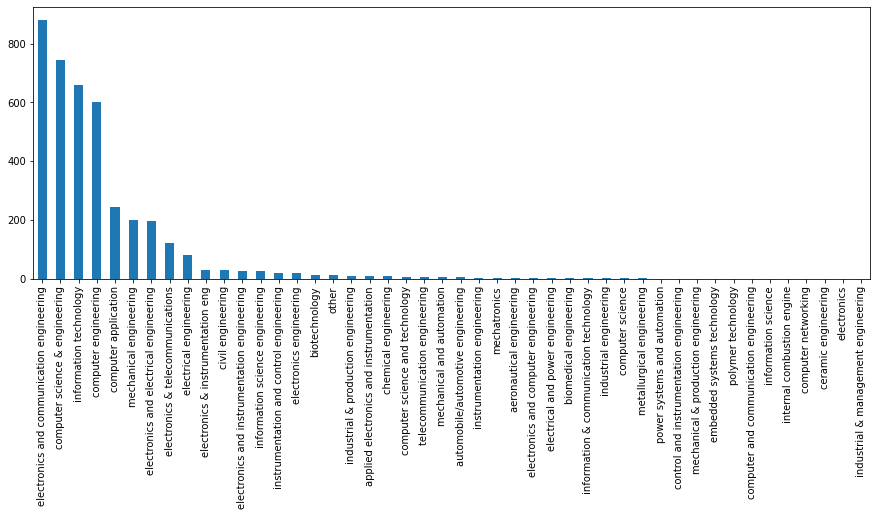

In [84]:
#One hot encoding specialization

specialization_freq = df['Specialization'].value_counts()
specialization_freq.plot(kind='bar', figsize=(15,5))

In [85]:
specialization_map = \
{'electronics and communication engineering' : 'EC',
 'computer science & engineering' : 'CS',
 'information technology' : 'CS' ,
 'computer engineering' : 'CS',
 'computer application' : 'CS',
 'mechanical engineering' : 'ME',
 'electronics and electrical engineering' : 'EC',
 'electronics & telecommunications' : 'EC',
 'electrical engineering' : 'EL',
 'electronics & instrumentation eng' : 'EC',
 'civil engineering' : 'CE',
 'electronics and instrumentation engineering' : 'EC',
 'information science engineering' : 'CS',
 'instrumentation and control engineering' : 'EC',
 'electronics engineering' : 'EC',
 'biotechnology' : 'other',
 'other' : 'other',
 'industrial & production engineering' : 'other',
 'chemical engineering' : 'other',
 'applied electronics and instrumentation' : 'EC',
 'computer science and technology' : 'CS',
 'telecommunication engineering' : 'EC',
 'mechanical and automation' : 'ME',
 'automobile/automotive engineering' : 'ME',
 'instrumentation engineering' : 'EC',
 'mechatronics' : 'ME',
 'electronics and computer engineering' : 'CS',
 'aeronautical engineering' : 'ME',
 'computer science' : 'CS',
 'metallurgical engineering' : 'other',
 'biomedical engineering' : 'other',
 'industrial engineering' : 'other',
 'information & communication technology' : 'EC',
 'electrical and power engineering' : 'EL',
 'industrial & management engineering' : 'other',
 'computer networking' : 'CS',
 'embedded systems technology' : 'EC',
 'power systems and automation' : 'EL',
 'computer and communication engineering' : 'CS',
 'information science' : 'CS',
 'internal combustion engine' : 'ME',
 'ceramic engineering' : 'other',
 'mechanical & production engineering' : 'ME',
 'control and instrumentation engineering' : 'EC',
 'polymer technology' : 'other',
 'electronics' : 'EC'}

['CS' 'EC' 'ME' 'EL' 'CE' 'other']


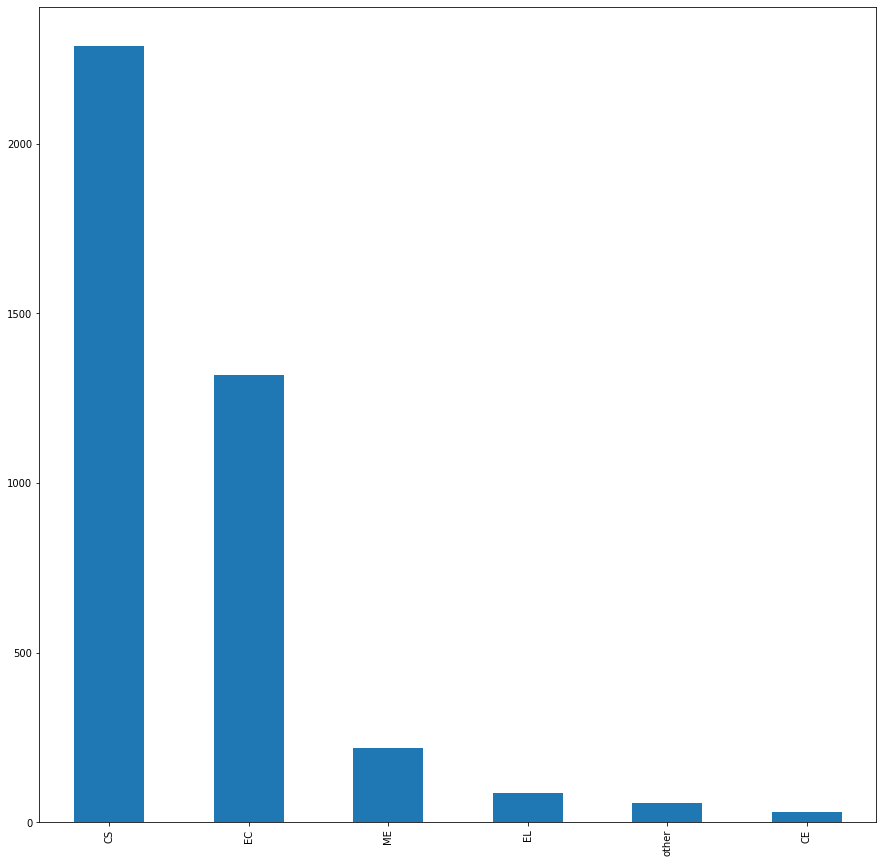

In [86]:
df['Specialization'] = df['Specialization'].map(specialization_map)

df['Specialization'].value_counts().plot(kind='bar', figsize=(15,15))

print(df['Specialization'].unique())

In [87]:
category_list=[ 'Gender', '12board', 'Degree','Specialization']

In [88]:
#One hot encoding the categorical columns

for feature in category_list:
    df = pd.get_dummies(df, prefix=feature, columns=[feature])

In [89]:
#Categorizing the salary to 5 categories

from sklearn import preprocessing
bin = [0,.25,.5,.75,1]
category = pd.qcut(df['Salary'],bin)
category = category.to_frame()
category.columns = ['Sal']
y_cat = pd.concat([df['Salary'],category],axis = 1)

#labelencode
le = preprocessing.LabelEncoder()
le.fit(y_cat['Sal'])
le.classes_
Y_train_cat=le.transform(y_cat['Sal']) 

In [90]:
Y_train_cat

array([3, 3, 2, ..., 2, 1, 3])

In [91]:
X_train=pd.DataFrame(df.drop(columns=['Salary'],axis=1))
Y_train=pd.DataFrame(df['Salary'])
Y_train_cat=pd.DataFrame(Y_train_cat)
print(X_train.shape,Y_train.shape,Y_train_cat.shape)

(3998, 53) (3998, 1) (3998, 1)
